# Importing Libraries 

**Digital Imaging and Communications in Medicine (DICOM)** is the standard for the communication and management of medical imaging information and related data. DICOM is most commonly used for storing and transmitting medical images enabling the integration of medical imaging devices such as scanners, servers, workstations, printers, network hardware, and picture archiving and communication systems (PACS) from multiple manufacturers. It has been widely adopted by hospitals and is making inroads into smaller applications such as dentists' and doctors' offices.

Wikipedia

In [1]:
# Pydicom is used to read Dicom files
import pydicom
import matplotlib.pyplot as plt

In [2]:
# Readind the Dicom file
dicom_file = pydicom.read_file("../input/rsna-miccai-brain-tumor-radiogenomic-classification/test/00001/FLAIR/Image-118.dcm")

In [3]:
# Print some metadata
print(dicom_file.file_meta, end="/n/n")
print(dicom_file.filename, end="/n/n") 
print(dicom_file.fileobj_type, end="/n/n")
print(dicom_file.timestamp) 

(0002, 0010) Transfer Syntax UID                 UI: Implicit VR Little Endian/n/n../input/rsna-miccai-brain-tumor-radiogenomic-classification/test/00001/FLAIR/Image-118.dcm/n/n<built-in function open>/n/n1626216615.7108681


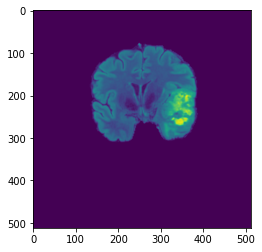

In [4]:
# Plt the image 
data = dicom_file.pixel_array  # This extract the pixel data of image from dicom_file
plt.imshow(data)

In [5]:
# Finding the max and min value of pixel
import numpy as np
np.max(data), np.min(data)

# We need to convert it into 8 bit 

(2976, 0)

In [6]:
# Total file in a dir 
import os 
files = os.listdir("../input/rsna-miccai-brain-tumor-radiogenomic-classification/test/00001/FLAIR/")
(files) , (len(files))

(['Image-130.dcm',
  'Image-98.dcm',
  'Image-4.dcm',
  'Image-63.dcm',
  'Image-74.dcm',
  'Image-83.dcm',
  'Image-41.dcm',
  'Image-71.dcm',
  'Image-2.dcm',
  'Image-201.dcm',
  'Image-88.dcm',
  'Image-99.dcm',
  'Image-146.dcm',
  'Image-73.dcm',
  'Image-3.dcm',
  'Image-193.dcm',
  'Image-23.dcm',
  'Image-132.dcm',
  'Image-169.dcm',
  'Image-208.dcm',
  'Image-57.dcm',
  'Image-129.dcm',
  'Image-185.dcm',
  'Image-119.dcm',
  'Image-127.dcm',
  'Image-72.dcm',
  'Image-192.dcm',
  'Image-156.dcm',
  'Image-84.dcm',
  'Image-5.dcm',
  'Image-180.dcm',
  'Image-19.dcm',
  'Image-207.dcm',
  'Image-43.dcm',
  'Image-153.dcm',
  'Image-148.dcm',
  'Image-16.dcm',
  'Image-90.dcm',
  'Image-40.dcm',
  'Image-179.dcm',
  'Image-124.dcm',
  'Image-120.dcm',
  'Image-133.dcm',
  'Image-81.dcm',
  'Image-33.dcm',
  'Image-51.dcm',
  'Image-22.dcm',
  'Image-80.dcm',
  'Image-116.dcm',
  'Image-123.dcm',
  'Image-27.dcm',
  'Image-85.dcm',
  'Image-101.dcm',
  'Image-32.dcm',
  'Image

In [7]:
# Function taken from https://www.kaggle.com/ihelon/brain-tumor-eda-with-animations-and-modeling
import glob


def load_dicom(path):
    dicom = pydicom.read_file(path)
    data = dicom.pixel_array
    data = data - np.min(data)  
    if np.max(data) != 0:
        data = data / np.max(data) # Normalizing and then multiplying by 255 for creating value between 0-255
    data = (data * 255).astype(np.uint8)
    return data



from matplotlib import animation, rc
rc('animation', html='jshtml')


def create_animation(ims):
    fig = plt.figure(figsize=(6, 6))
    plt.axis('off')
    im = plt.imshow(ims[0], cmap="gray")

    def animate_func(i):
        im.set_array(ims[i])
        return [im]

    return animation.FuncAnimation(fig, animate_func, frames = len(ims), interval = 1000//24)

def load_dicom_line(path):
    t_paths = sorted(
        glob.glob(os.path.join(path, "*")), 
        key=lambda x: int(x[:-4].split("-")[-1]),
    )
    images = []
    for filename in t_paths:
        data = load_dicom(filename)
        if data.max() == 0:
            continue
        images.append(data)
        
    return images

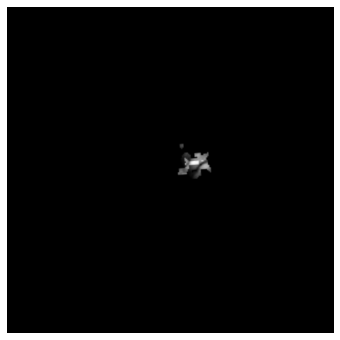

In [8]:
# Each folder is a patient id inside train and test and each folder cotains 4 type of MRI images and each folder 
# contain series of files which is the series of images joined together to form 3-D image


## FLAIR
images = load_dicom_line("../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00002/FLAIR")
create_animation(images)

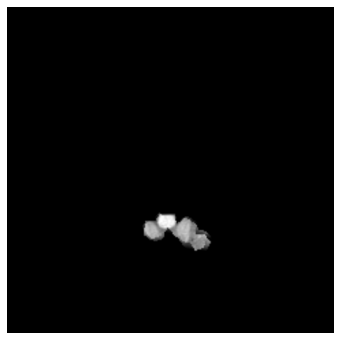

In [9]:
##  T1w
images = load_dicom_line("../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00002/T1w")
create_animation(images)

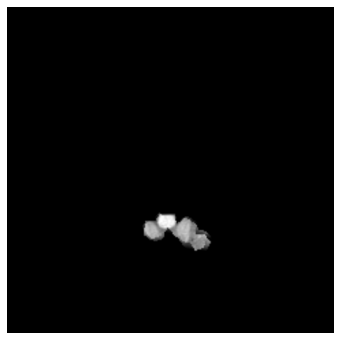

In [10]:
##  T1wCE

images = load_dicom_line("../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00002/T1w")
create_animation(images)

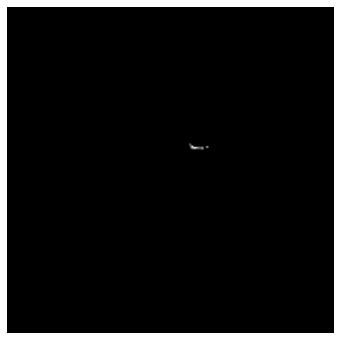

In [11]:
##  T2w
images = load_dicom_line("../input/rsna-miccai-brain-tumor-radiogenomic-classification/train/00002/T2w")
create_animation(images)

In [12]:
# Are the number of images in all folders same? Cuz it decide the 3rd dimension shape of image . lets check

train_dir = "../input/rsna-miccai-brain-tumor-radiogenomic-classification/train"
all_folders = os.listdir(train_dir)
s_folder = ['T2w', 'T1wCE', 'T1w', 'FLAIR']
for f in all_folders:
    s_path = os.path.join(train_dir, f)
    print(len(os.listdir(os.path.join(s_path, s_folder[0]))), len(os.listdir(os.path.join(s_path, s_folder[1]))), len(os.listdir(os.path.join(s_path, s_folder[2]))), len(os.listdir(os.path.join(s_path, s_folder[3]))) )

376 214 214 196
384 120 29 257
416 222 32 196
64 192 192 60
129 129 352 216
129 129 372 216
64 192 192 60
408 242 242 200
38 75 38 75
27 182 182 27
64 192 192 60
64 192 192 60
230 188 188 348
64 192 192 60
376 156 156 216
64 192 192 60
384 204 160 176
27 182 184 27
64 192 192 60
25 25 25 25
176 292 31 194
64 192 192 60
64 192 192 60
408 129 35 129
64 192 192 60
64 192 192 60
448 129 35 216
87 41 136 59
208 352 352 208
60 192 192 60
39 45 39 78
23 23 23 23
60 192 192 60
60 192 192 60
256 288 288 216
60 208 208 60
416 129 30 129
129 126 33 257
86 130 130 58
93 138 138 62
400 214 256 220
456 214 194 216
32 32 32 60
180 352 352 192
64 192 192 60
416 352 31 216
168 150 30 168
408 176 176 200
432 196 196 228
64 192 192 60
64 192 192 60
64 192 192 60
376 296 296 222
64 192 192 60
25 25 25 25
64 192 192 60
64 192 192 60
129 120 30 257
408 129 32 129
384 164 164 200
64 192 192 60
44 120 26 36
376 198 198 196
64 192 192 60
416 216 392 216
376 156 156 220
21 21 21 21
82 136 136 55
184 190 190 196

In [13]:
# There are different number of images present in each folder so the 3rd dimension of image is not contant

In [14]:
# Lets also see teh shape of eaxh images are constant or not 
# Are the number of images in all folders same? Cuz it decide the 3rd dimension shape of image . lets check

width = []
height = []
train_dir = "../input/rsna-miccai-brain-tumor-radiogenomic-classification/train"
all_folders = os.listdir(train_dir)
s_folder = ['T2w', 'T1wCE', 'T1w', 'FLAIR']
for f in all_folders:
    s_path = os.path.join(train_dir, f)
    for fol in s_folder:
        files = os.listdir(os.path.join(s_path, fol))
        for im in files:
            img_path = os.path.join(os.path.join(s_path, fol), im)
            dicom_file = pydicom.read_file(img_path)
            height.append((dicom_file.pixel_array).shape[0])
            width.append((dicom_file.pixel_array).shape[1])
        

In [15]:
# Find all shapes of width and height 

set(height), set(width)

({232, 240, 244, 256, 320, 384, 440, 448, 480, 512, 640, 672, 768, 1024},
 {192,
  204,
  208,
  216,
  224,
  232,
  236,
  240,
  244,
  250,
  256,
  260,
  272,
  280,
  288,
  290,
  312,
  320,
  336,
  348,
  364,
  384,
  406,
  408,
  416,
  424,
  432,
  440,
  448,
  464,
  480,
  512,
  640,
  672,
  768,
  1014})